In [63]:
import pandas as pd

# Load the dataset
df = pd.read_csv("pubchem_fp_dataset.csv")

In [64]:
# Remove constant columns (columns with the same value across all rows)
df_filtered = df.loc[:, (df.nunique() > 1)]

In [65]:
import pandas as pd
import numpy as np  # Import numpy

# Identify highly correlated features
correlation_matrix = df_filtered.iloc[:, 1:-1].corr().abs()  # Excluding 'Name' and 'pIC50'
upper_triangle = correlation_matrix.where(
    ~np.tril(np.ones(correlation_matrix.shape), k=0).astype(bool) # Use np instead of pd.np
)

In [66]:
# Find columns with high correlation (> 0.9)
high_correlation_features = [
    column for column in upper_triangle.columns if any(upper_triangle[column] > 0.9)
]

In [67]:
# Drop highly correlated features
df_final = df_filtered.drop(columns=high_correlation_features)

In [68]:
# Save the cleaned dataset
df_final.to_csv("Filtered_Dataset.csv", index=False)

In [69]:
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score

In [70]:
# Load the cleaned dataset
df = pd.read_csv("Filtered_Dataset.csv")

In [71]:
# Splitting dataset (Retaining 'Name' column in train and test sets)
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

# Save training and test sets
train_df.to_csv("Training_Dataset.csv", index=False)
test_df.to_csv("Test_Dataset.csv", index=False)

In [73]:
# Extract Features (X) and Target (y) without 'Name'
X_train = train_df.iloc[:, 1:-1]  # Molecular descriptors
y_train = train_df.iloc[:, -1]  # pIC50

X_test = test_df.iloc[:, 1:-1]
y_test = test_df.iloc[:, -1]

In [23]:
# Existing dictionary of untuned base models for classification
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "SVM": SVC(kernel="rbf", probability=True),
    "XGBoost": XGBClassifier(objective="binary:logistic", n_estimators=100, random_state=42),
    "ANN": MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500, random_state=42)
}

# Assign to variables
best_rf = models["Random Forest"]
best_svm = models["SVM"]
best_xgb = models["XGBoost"]
best_ann = models["ANN"]

In [74]:
import numpy as np
from sklearn.model_selection import RandomizedSearchCV, KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier

# Define K-Fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# 1️⃣ Random Forest Hyperparameter Tuning
rf_params = {
    "n_estimators": [100, 200, 300, 500],
    "max_depth": [None, 10, 20, 30],
    "min_samples_split": [2, 5, 10],
    "max_features": ["sqrt", "log2", None]
}

rf_search = RandomizedSearchCV(
    RandomForestClassifier(random_state=42),
    param_distributions=rf_params,
    cv=kf,
    n_iter=20,
    scoring="accuracy",
    n_jobs=-1,
    random_state=42
)
rf_search.fit(X_train, y_train)
best_rf = rf_search.best_estimator_

# 2️⃣ SVM Hyperparameter Tuning
svm_params = {
    "C": [0.1, 1, 10, 100],
    "gamma": [0.001, 0.01, 0.1, 1],
    "kernel": ["rbf", "poly", "sigmoid"]
}

svm_search = RandomizedSearchCV(
    SVC(probability=True, random_state=42),
    param_distributions=svm_params,
    cv=kf,
    n_iter=20,
    scoring="accuracy",
    n_jobs=-1,
    random_state=42
)
svm_search.fit(X_train, y_train)
best_svm = svm_search.best_estimator_

# 3️⃣ XGBoost Hyperparameter Tuning
xgb_params = {
    "n_estimators": [100, 200, 300, 500],
    "max_depth": [3, 5, 7, 10],
    "learning_rate": [0.001, 0.01, 0.1, 0.2],
    "subsample": [0.7, 0.8, 0.9, 1.0],
    "colsample_bytree": [0.7, 0.8, 0.9, 1.0]
}

xgb_search = RandomizedSearchCV(
    XGBClassifier(objective="binary:logistic", random_state=42, use_label_encoder=False, eval_metric="logloss"),
    param_distributions=xgb_params,
    cv=kf,
    n_iter=20,
    scoring="accuracy",
    n_jobs=-1,
    random_state=42
)
xgb_search.fit(X_train, y_train)
best_xgb = xgb_search.best_estimator_

# 4️⃣ ANN Hyperparameter Tuning
ann_params = {
    "hidden_layer_sizes": [(50,), (100, 50), (100, 50, 25)],
    "activation": ["relu", "tanh"],
    "solver": ["adam", "sgd"],
    "learning_rate_init": [0.001, 0.01, 0.1],
    "max_iter": [500, 1000, 1500]
}

ann_search = RandomizedSearchCV(
    MLPClassifier(random_state=42),
    param_distributions=ann_params,
    cv=kf,
    n_iter=20,
    scoring="accuracy",
    n_jobs=-1,
    random_state=42
)
ann_search.fit(X_train, y_train)
best_ann = ann_search.best_estimator_

# Final Best Models Dictionary
models = {
    "Random Forest": best_rf,
    "SVM": best_svm,
    "XGBoost": best_xgb,
    "ANN": best_ann
}

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [18:49:57] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [75]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             roc_curve, auc)
# Assuming models dict has been defined as in the previous code block for classification
# and that X_train, X_test, y_train, y_test are already defined.

# K-Fold Cross-Validation Setup
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# List to store results
results_list = []

# Train and evaluate models
for name, model in models.items():
    model.fit(X_train, y_train)

    # Predictions (class labels)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Compute Metrics for classification
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_precision = precision_score(y_train, y_train_pred, average='weighted', zero_division=0)
    test_precision = precision_score(y_test, y_test_pred, average='weighted', zero_division=0)
    train_recall = recall_score(y_train, y_train_pred, average='weighted', zero_division=0)
    test_recall = recall_score(y_test, y_test_pred, average='weighted', zero_division=0)
    train_f1 = f1_score(y_train, y_train_pred, average='weighted', zero_division=0)
    test_f1 = f1_score(y_test, y_test_pred, average='weighted', zero_division=0)

    try:
        # Cross-validation scores using accuracy
        cv_accuracy = np.mean(cross_val_score(model, X_train, y_train, scoring='accuracy', cv=kf))
    except Exception as e:
        print(f"Cross-validation error for {name}: {e}")
        cv_accuracy = np.nan

    # Append results
    results_list.append({
        "Algorithm": name,
        "Train Accuracy": train_accuracy,
        "Test Accuracy": test_accuracy,
        "CV Accuracy": cv_accuracy,
        "Train Precision": train_precision,
        "Test Precision": test_precision,
        "Train Recall": train_recall,
        "Test Recall": test_recall,
        "Train F1": train_f1,
        "Test F1": test_f1
    })

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [18:52:59] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [18:52:59] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [18:53:00] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [18:53:00] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [18:53:00] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_e

In [76]:
# Convert results to DataFrame
results_df = pd.DataFrame(results_list)

# Save results to CSV
results_df.to_csv("Model_Performance.csv", index=False)

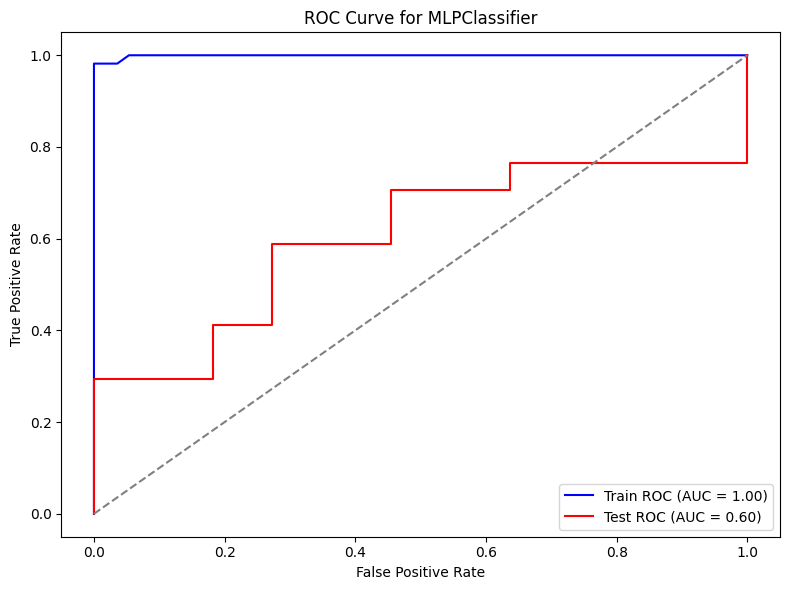

In [77]:
# ROC Curve Plot for one selected classifier (e.g., best_ann)

# Ensure the selected classifier supports predict_proba (for SVC, probability=True must be set)
selected_model = best_ann  # Now using the ANN classifier

# Compute probability estimates for the positive class (assumes binary classification)
y_train_prob = selected_model.predict_proba(X_train)[:, 1]
y_test_prob = selected_model.predict_proba(X_test)[:, 1]

# Compute ROC curve and AUC for training data
fpr_train, tpr_train, _ = roc_curve(y_train, y_train_prob)
roc_auc_train = auc(fpr_train, tpr_train)

# Compute ROC curve and AUC for test data
fpr_test, tpr_test, _ = roc_curve(y_test, y_test_prob)
roc_auc_test = auc(fpr_test, tpr_test)

# Plotting ROC curves
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', label=f'Train ROC (AUC = {roc_auc_train:.2f})')
plt.plot(fpr_test, tpr_test, color='red', label=f'Test ROC (AUC = {roc_auc_test:.2f})')
# Plot chance line without label
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for {}'.format(selected_model.__class__.__name__))
plt.legend(loc="lower right")
plt.tight_layout()
plt.savefig("roc_curve.png", dpi=600)
plt.show()

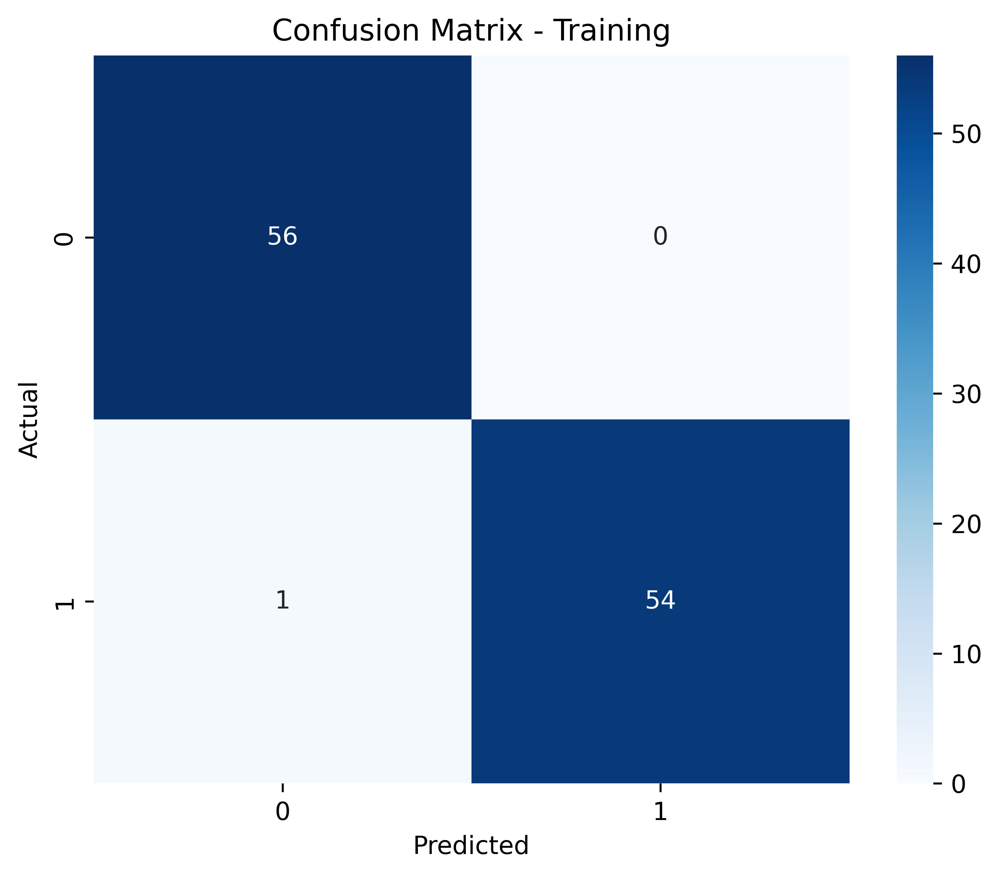

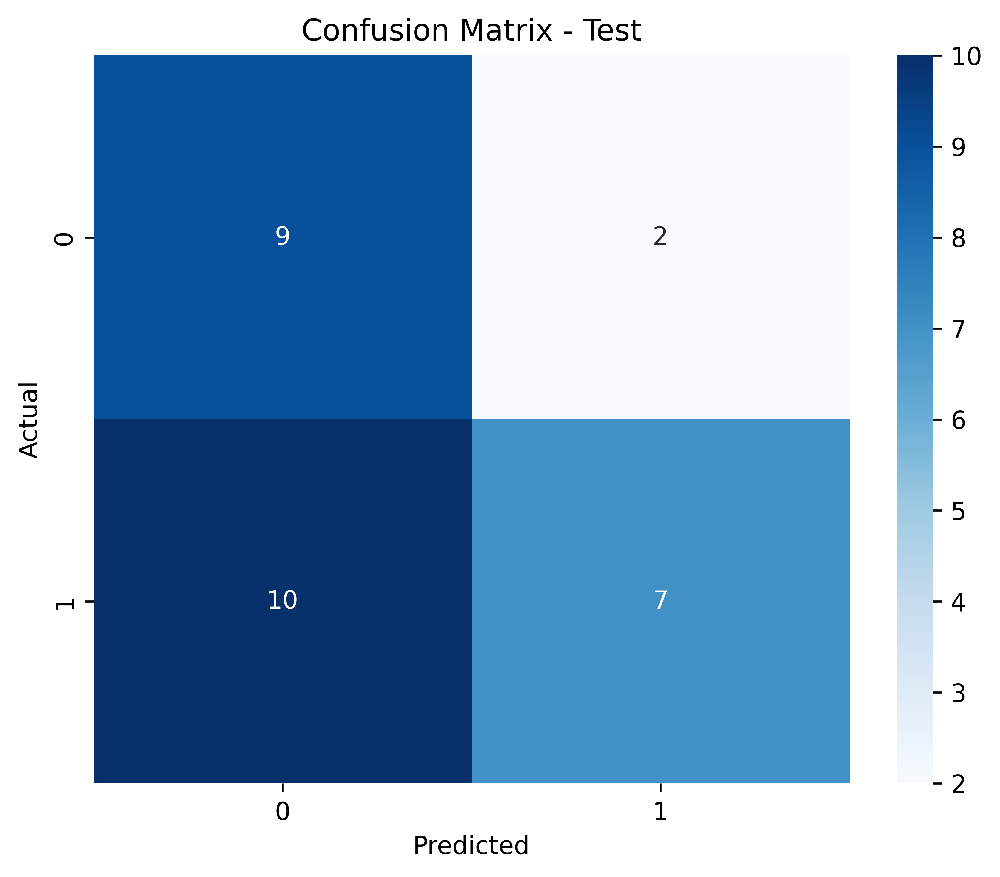

In [78]:
# --- Confusion Matrix Plots ---
# Generate predictions for training and test sets
y_train_pred = selected_model.predict(X_train)
y_test_pred = selected_model.predict(X_test)

# Compute confusion matrices
cm_train = confusion_matrix(y_train, y_train_pred)
cm_test = confusion_matrix(y_test, y_test_pred)

# Plot Confusion Matrix for Training Data
plt.figure(figsize=(6, 5), dpi=600)
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Training')
plt.tight_layout()
plt.savefig("confusion_matrix_train.png", dpi=600)
plt.show()

# Plot Confusion Matrix for Test Data
plt.figure(figsize=(6, 5), dpi=600)
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Test')
plt.tight_layout()
plt.savefig("confusion_matrix_test.png", dpi=600)
plt.show()

In [30]:
# Load training and test datasets
train_file_path = "Training_Dataset.csv"
test_file_path = "Test_Dataset.csv"

train_df = pd.read_csv(train_file_path)
test_df = pd.read_csv(test_file_path)

# Combine datasets for outlier analysis
train_df["Dataset"] = "Train"
test_df["Dataset"] = "Test"
combined_df = pd.concat([train_df, test_df])

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from scipy.spatial.distance import cdist

# Extract molecular descriptors only (excluding Name, Dataset, and pIC50)
X = combined_df.drop(columns=['Name', 'Dataset', 'Activity'])

# Apply PCA for dimensionality reduction (2D for visualization)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)
combined_df["PCA1"] = X_pca[:, 0]
combined_df["PCA2"] = X_pca[:, 1]

# Apply K-means clustering on PCA-reduced data
kmeans = KMeans(n_clusters=2, random_state=42)
combined_df["Cluster"] = kmeans.fit_predict(X_pca)

# Determine Applicability Domain (AD) using cluster centroids
centroid_distances = cdist(X_pca, kmeans.cluster_centers_)  # Now using PCA space
combined_df["Distance_to_Centroid"] = np.min(centroid_distances, axis=1)

# Define threshold for outliers (e.g., top 5% farthest points)
outlier_threshold = np.percentile(combined_df["Distance_to_Centroid"], 95)
combined_df["Outlier"] = combined_df["Distance_to_Centroid"] > outlier_threshold

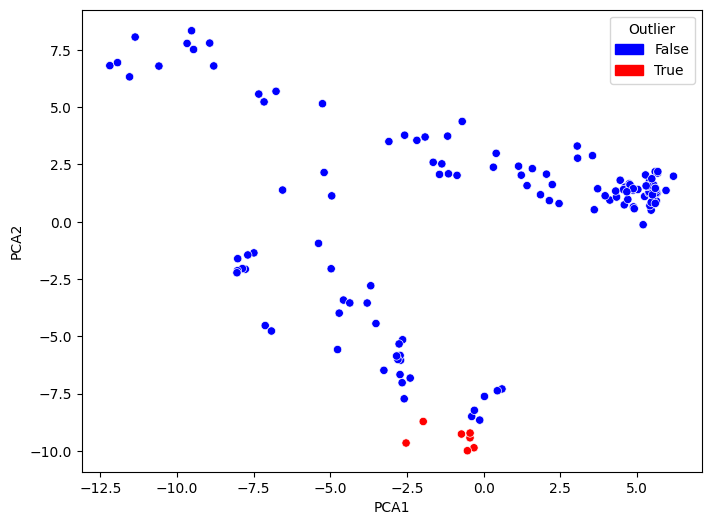

In [34]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from scipy.spatial.distance import cdist
from sklearn.preprocessing import StandardScaler
import matplotlib.patches as mpatches

# Standardize data before PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(combined_df.drop(columns=['Name', 'Dataset', 'Activity']))

# Apply PCA with higher components
pca = PCA(n_components=10)  # Keeping more variance initially
X_pca_full = pca.fit_transform(X_scaled)

# Retain only first 2 principal components for visualization
X_pca_2d = X_pca_full[:, :2]
combined_df["PCA1"] = X_pca_2d[:, 0]
combined_df["PCA2"] = X_pca_2d[:, 1]

# Apply K-means clustering on PCA-reduced data
kmeans = KMeans(n_clusters=2, random_state=42)
combined_df["Cluster"] = kmeans.fit_predict(X_pca_2d)

# Compute Mahalanobis distance instead of Euclidean
centroid_distances = cdist(X_pca_2d, kmeans.cluster_centers_, metric='mahalanobis')
combined_df["Distance_to_Centroid"] = np.min(centroid_distances, axis=1)

# Set stricter threshold for outliers (90th percentile)
outlier_threshold = np.percentile(combined_df["Distance_to_Centroid"], 95)
combined_df["Outlier"] = combined_df["Distance_to_Centroid"] > outlier_threshold

# Visualization
plt.figure(figsize=(8, 6))

# Scatter plot with only circular dots
sns.scatterplot(data=combined_df, x="PCA1", y="PCA2", hue="Outlier", style="Outlier",
                markers={False: "o", True: "o"}, palette={False: "blue", True: "red"})

# Create a custom legend with different colors
true_patch = mpatches.Patch(color='red', label="True")
false_patch = mpatches.Patch(color='blue', label="False")
plt.legend(handles=[false_patch, true_patch], title="Outlier")

# Remove axis labels for a cleaner look
plt.xlabel("PCA1")
plt.ylabel("PCA2")

# Save the figure with 600 dpi resolution
plt.savefig("PCA_Clean_Outliers_ColoredLegend.png", dpi=600, bbox_inches='tight')

plt.show()

In [35]:
# Save outliers to CSV
outliers_df = combined_df[combined_df["Outlier"]]
outliers_df.to_csv("Outliers_Detected.csv", index=False)

# Remove outliers and save cleaned datasets
train_df_cleaned = train_df[~train_df["Name"].isin(outliers_df["Name"])]
test_df_cleaned = test_df[~test_df["Name"].isin(outliers_df["Name"])]

train_df_cleaned.to_csv("Training_Dataset_Cleaned.csv", index=False)
test_df_cleaned.to_csv("Test_Dataset_Cleaned.csv", index=False)

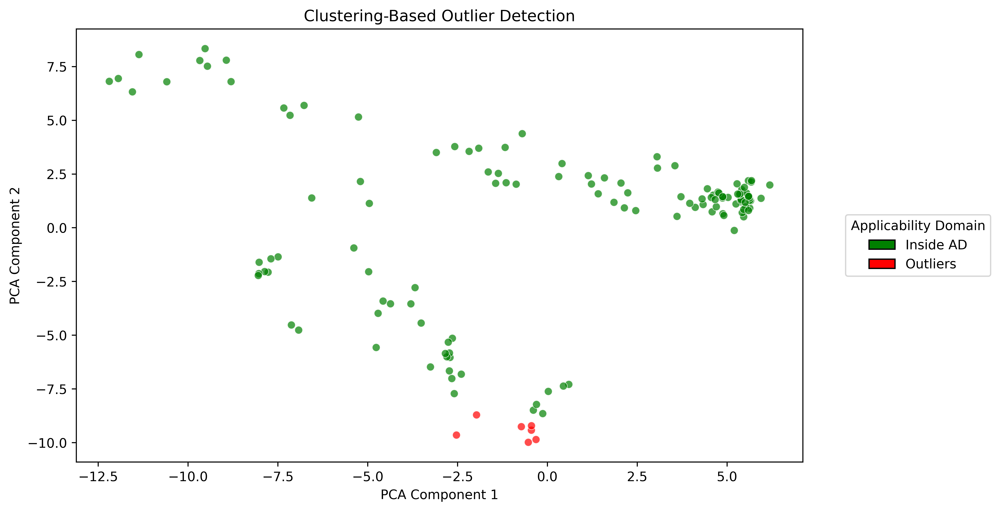

Plot saved successfully at: PCA_Clustering_Outliers.png


In [36]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch

# Define colors explicitly
colors = {False: "green", True: "red"}

# Create scatter plot
fig, ax = plt.subplots(figsize=(10, 6), dpi=600)  # Explicitly create figure
sns.scatterplot(
    x=combined_df["PCA1"],
    y=combined_df["PCA2"],
    hue=combined_df["Outlier"],
    palette=colors,
    alpha=0.7
)

plt.title("Clustering-Based Outlier Detection")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")

# Manually create legend outside the plot
legend_elements = [
    Patch(facecolor="green", edgecolor="black", label="Inside AD"),
    Patch(facecolor="red", edgecolor="black", label="Outliers")
]

plt.legend(
    handles=legend_elements,
    title="Applicability Domain",
    loc="center left",
    bbox_to_anchor=(1.05, 0.5)  # Moves legend outside the PCA box
)

# **Save the figure FIRST before showing it**
save_path = "PCA_Clustering_Outliers.png"  # Change to an absolute path if needed
fig.savefig(save_path, dpi=600, bbox_inches="tight")  # Use `fig.savefig()` instead of `plt.gcf().savefig()`

# **Now, display the plot**
plt.show()

print(f"Plot saved successfully at: {save_path}")

In [37]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
# Optionally, you can import ROC and AUC metrics if needed:
# from sklearn.metrics import roc_curve, auc

# Load cleaned training and test datasets
train_file_path = "Training_Dataset_Cleaned.csv"
test_file_path = "Test_Dataset_Cleaned.csv"

train_df = pd.read_csv(train_file_path)
test_df = pd.read_csv(test_file_path)

In [38]:
# Extract Features (X) and Target (y) without 'Name' and 'Dataset'
X_train = train_df.drop(columns=['Name', 'Dataset', 'Activity'])  # Molecular descriptors
y_train = train_df['Activity']  # pIC50

X_test = test_df.drop(columns=['Name', 'Dataset', 'Activity'])
y_test = test_df['Activity']

In [39]:
# Existing dictionary of untuned base models for classification
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "SVM": SVC(kernel="rbf", probability=True),
    "XGBoost": XGBClassifier(objective="binary:logistic", n_estimators=100, random_state=42),
    "ANN": MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500, random_state=42)
}

# Assign to variables
best_rf = models["Random Forest"]
best_svm = models["SVM"]
best_xgb = models["XGBoost"]
best_ann = models["ANN"]

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             roc_curve, auc)
# Assuming models dict has been defined as in the previous code block for classification
# and that X_train, X_test, y_train, y_test are already defined.

# K-Fold Cross-Validation Setup
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# List to store results
results_list = []

# Train and evaluate models
for name, model in models.items():
    model.fit(X_train, y_train)

    # Predictions (class labels)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Compute Metrics for classification
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_precision = precision_score(y_train, y_train_pred, average='weighted', zero_division=0)
    test_precision = precision_score(y_test, y_test_pred, average='weighted', zero_division=0)
    train_recall = recall_score(y_train, y_train_pred, average='weighted', zero_division=0)
    test_recall = recall_score(y_test, y_test_pred, average='weighted', zero_division=0)
    train_f1 = f1_score(y_train, y_train_pred, average='weighted', zero_division=0)
    test_f1 = f1_score(y_test, y_test_pred, average='weighted', zero_division=0)

    try:
        # Cross-validation scores using accuracy
        cv_accuracy = np.mean(cross_val_score(model, X_train, y_train, scoring='accuracy', cv=kf))
    except Exception as e:
        print(f"Cross-validation error for {name}: {e}")
        cv_accuracy = np.nan

    # Append results
    results_list.append({
        "Algorithm": name,
        "Train Accuracy": train_accuracy,
        "Test Accuracy": test_accuracy,
        "CV Accuracy": cv_accuracy,
        "Train Precision": train_precision,
        "Test Precision": test_precision,
        "Train Recall": train_recall,
        "Test Recall": test_recall,
        "Train F1": train_f1,
        "Test F1": test_f1
    })

In [41]:
# Convert results to DataFrame
results_df = pd.DataFrame(results_list)

# Save results to CSV
results_df.to_csv("Model_Performance_AD.csv", index=False)

In [42]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, KFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

In [43]:
# Load cleaned training and test datasets
train_file_path = "Training_Dataset_Cleaned.csv"
test_file_path = "Test_Dataset_Cleaned.csv"

train_df = pd.read_csv(train_file_path)
test_df = pd.read_csv(test_file_path)

# Extract Features (X) and Target (y) without 'Name' and 'Dataset'
X_train = train_df.drop(columns=['Name', 'Dataset', 'Activity'])  # Molecular descriptors
y_train = train_df['Activity']  # pIC50

X_test = test_df.drop(columns=['Name', 'Dataset', 'Activity'])
y_test = test_df['Activity']

# Define K-Fold for Cross-Validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

In [44]:
# 1️⃣ **Random Forest Hyperparameter Tuning**
rf_params = {
    "n_estimators": [100, 300, 500, 700],
    "max_depth": [10, 20, 30, None],
    "min_samples_split": [2, 4, 6],
    "max_features": ["sqrt", "log2"]
}

rf_grid = RandomizedSearchCV(RandomForestClassifier(random_state=42),
                             rf_params, cv=kf, n_iter=10, scoring="accuracy", n_jobs=-1)
rf_grid.fit(X_train, y_train)
best_rf = rf_grid.best_estimator_

# 2️⃣ **SVM Hyperparameter Tuning**
svm_params = {
    "C": [1, 10, 50, 100],
    "gamma": [0.1, 0.01, 0.001, 0.0001],
    "kernel": ["rbf", "poly", "sigmoid"]
}

svm_grid = RandomizedSearchCV(SVC(probability=True, random_state=42),
                              svm_params, cv=kf, n_iter=10, scoring="accuracy", n_jobs=-1)
svm_grid.fit(X_train, y_train)
best_svm = svm_grid.best_estimator_

# 3️⃣ **ANN Hyperparameter Tuning**
ann_params = {
    "hidden_layer_sizes": [(128, 64), (256, 128, 64), (512, 256, 128)],
    "activation": ["relu", "tanh"],
    "solver": ["adam", "sgd"],
    "learning_rate_init": [0.001, 0.01, 0.1],
    "max_iter": [1000, 1500, 2000]
}

ann_grid = RandomizedSearchCV(MLPClassifier(random_state=42),
                              ann_params, cv=kf, n_iter=10, scoring="accuracy", n_jobs=-1)
ann_grid.fit(X_train, y_train)
best_ann = ann_grid.best_estimator_

# Final Best Models
models = {
    "Random Forest": best_rf,
    "SVM": best_svm,
    "ANN": best_ann
}

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             roc_curve, auc)
# Assuming models dict has been defined as in the previous code block for classification
# and that X_train, X_test, y_train, y_test are already defined.

# K-Fold Cross-Validation Setup
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# List to store results
results_list = []

# Train and evaluate models
for name, model in models.items():
    model.fit(X_train, y_train)

    # Predictions (class labels)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Compute Metrics for classification
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_precision = precision_score(y_train, y_train_pred, average='weighted', zero_division=0)
    test_precision = precision_score(y_test, y_test_pred, average='weighted', zero_division=0)
    train_recall = recall_score(y_train, y_train_pred, average='weighted', zero_division=0)
    test_recall = recall_score(y_test, y_test_pred, average='weighted', zero_division=0)
    train_f1 = f1_score(y_train, y_train_pred, average='weighted', zero_division=0)
    test_f1 = f1_score(y_test, y_test_pred, average='weighted', zero_division=0)

    try:
        # Cross-validation scores using accuracy
        cv_accuracy = np.mean(cross_val_score(model, X_train, y_train, scoring='accuracy', cv=kf))
    except Exception as e:
        print(f"Cross-validation error for {name}: {e}")
        cv_accuracy = np.nan

    # Append results
    results_list.append({
        "Algorithm": name,
        "Train Accuracy": train_accuracy,
        "Test Accuracy": test_accuracy,
        "CV Accuracy": cv_accuracy,
        "Train Precision": train_precision,
        "Test Precision": test_precision,
        "Train Recall": train_recall,
        "Test Recall": test_recall,
        "Train F1": train_f1,
        "Test F1": test_f1
    })

In [47]:
# Convert results to DataFrame
results_df = pd.DataFrame(results_list)

# Save results to CSV
results_df.to_csv("Model_Performance_HyperTuned.csv", index=False)

<ipython-input-48-6ca3b66414d2>:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=top_features["Feature"], x=top_features["Importance"], palette="viridis")


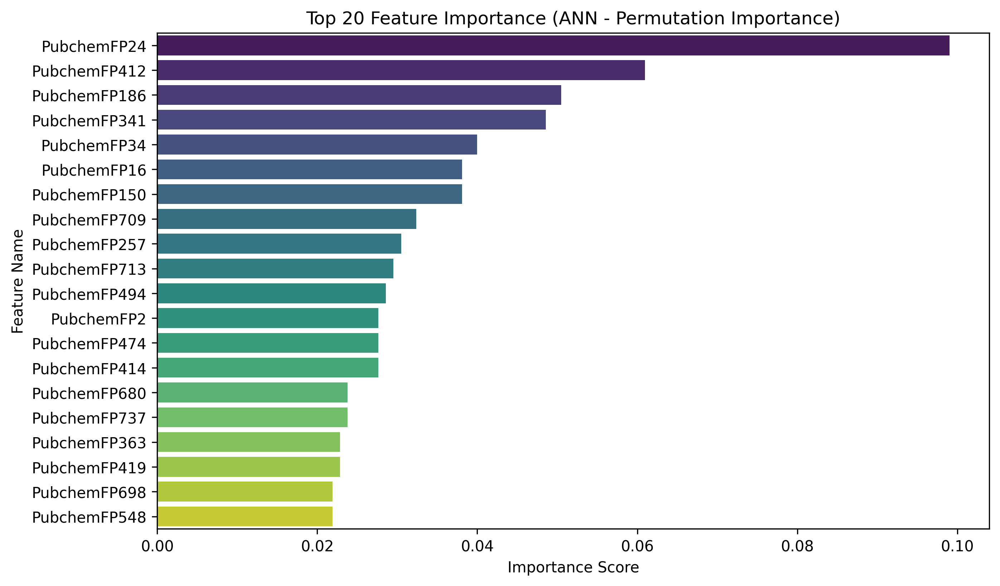

In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.inspection import permutation_importance

# Ensure X_train is loaded
train_file_path = "Training_Dataset_Cleaned.csv"
train_df = pd.read_csv(train_file_path)

# Extract Features and Target
X_train = train_df.drop(columns=['Name', 'Dataset', 'Activity'])  # Molecular descriptors
y_train = train_df['Activity']  # Classification target

# Assuming the trained ANN classifier is named 'best_ann'
# Compute Permutation Importance (ANN doesn't have built-in feature importance)
perm_importance = permutation_importance(best_ann, X_train, y_train, scoring="accuracy", n_repeats=10, random_state=42)

# Create DataFrame for feature importance
feature_names = X_train.columns
importance_df = pd.DataFrame({"Feature": feature_names, "Importance": perm_importance.importances_mean})

# Sort features by importance (Top 20)
top_features = importance_df.sort_values(by="Importance", ascending=False).head(20)

# Plot Feature Importance
plt.figure(figsize=(10, 6), dpi=300)
sns.barplot(y=top_features["Feature"], x=top_features["Importance"], palette="viridis")
plt.title("Top 20 Feature Importance (ANN - Permutation Importance)")
plt.xlabel("Importance Score")
plt.ylabel("Feature Name")

# Save feature importance plot
feature_importance_plot_path = "Feature_Importance_ANN_Top20.png"
plt.savefig(feature_importance_plot_path, dpi=600, bbox_inches="tight")
plt.show()

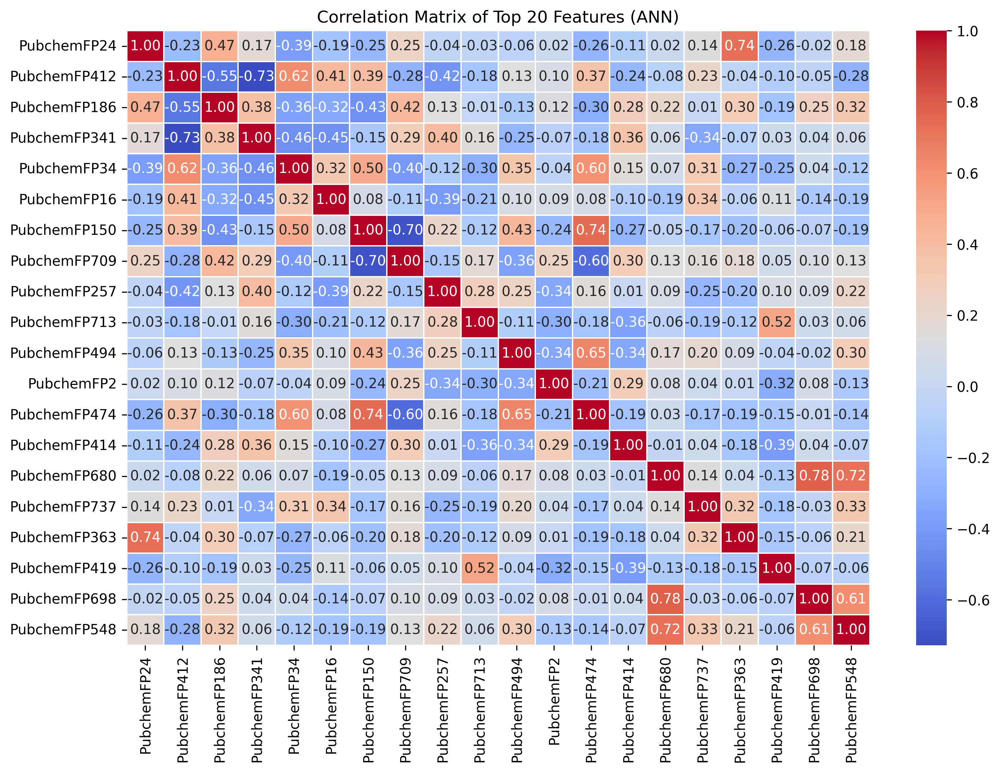

In [49]:
# Extract the top 20 feature names for correlation matrix
top_feature_names = top_features["Feature"].values

# Compute Correlation Matrix for Top 20 Features
correlation_matrix = X_train[top_feature_names].corr()

# Plot Correlation Matrix Heatmap
plt.figure(figsize=(12, 8), dpi=300)
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix of Top 20 Features (ANN)")

# Save correlation matrix plot
correlation_matrix_plot_path = "Correlation_Matrix_ANN_Top20.png"
plt.savefig(correlation_matrix_plot_path, dpi=600, bbox_inches="tight")
plt.show()

<ipython-input-50-885085bf2da8>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=pearson_df["Feature"], x=pearson_df["Pearson Correlation"], palette="coolwarm")


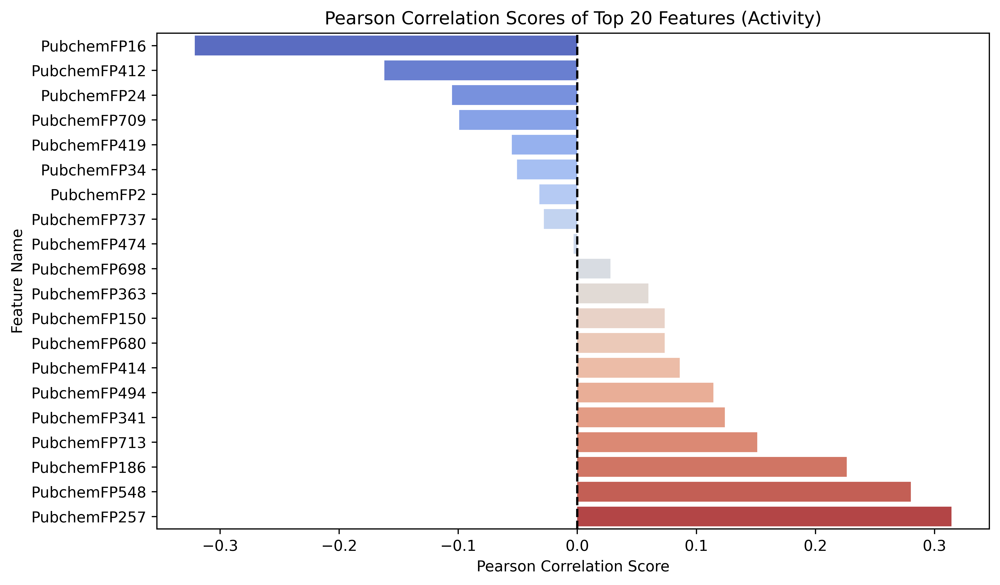

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Compute Pearson correlation scores of the top 20 features with Activity (binary target)
pearson_correlation_scores = X_train[top_feature_names].corrwith(y_train)

# Convert to DataFrame for better visualization
pearson_df = pd.DataFrame({
    "Feature": top_feature_names,
    "Pearson Correlation": pearson_correlation_scores.values
})

# Sort features by correlation score
pearson_df = pearson_df.sort_values(by="Pearson Correlation")

# Plot Pearson Correlation scores
plt.figure(figsize=(10, 6), dpi=600)
sns.barplot(y=pearson_df["Feature"], x=pearson_df["Pearson Correlation"], palette="coolwarm")
plt.axvline(x=0, color="black", linestyle="--")
plt.title("Pearson Correlation Scores of Top 20 Features (Activity)")
plt.xlabel("Pearson Correlation Score")
plt.ylabel("Feature Name")

# Save the Pearson correlation plot at 600 DPI
pearson_correlation_plot_path = "Pearson_Correlation_Top20.png"
plt.savefig(pearson_correlation_plot_path, dpi=600)
plt.show()

PermutationExplainer explainer: 106it [02:17,  1.36s/it]


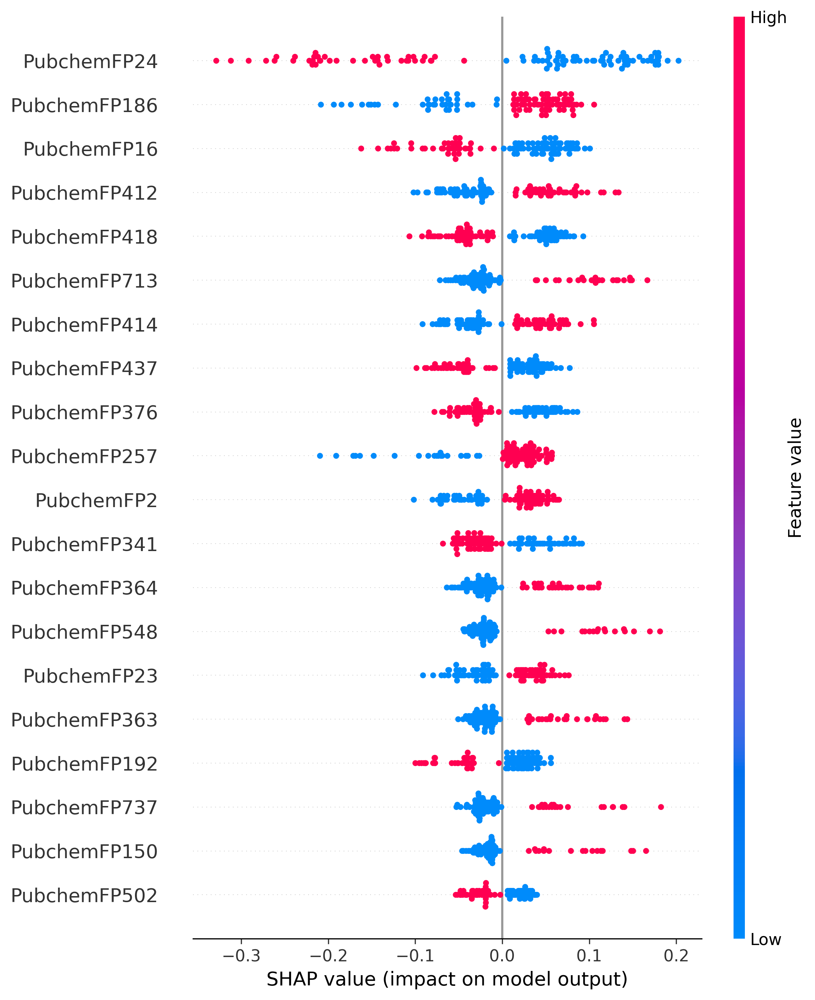

'SHAP_Analysis_ANN.png'

In [51]:
!pip install shap
import shap
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Load cleaned dataset
train_file_path = "Training_Dataset_Cleaned.csv"
train_df = pd.read_csv(train_file_path)

# Extract Features (X) and Target (y)
X_train = train_df.drop(columns=['Name', 'Dataset', 'Activity'])  # Molecular descriptors
y_train = train_df['Activity']  # Classification target

# Create SHAP Explainer for ANN classifier
# Use a lambda to output probability for the positive class (assumes binary classification)
explainer = shap.Explainer(lambda X: best_ann.predict_proba(X)[:, 1], X_train)
shap_values = explainer(X_train)

# Plot SHAP Summary
plt.figure(figsize=(10, 6), dpi=300)
shap.summary_plot(shap_values, X_train, show=False)

# Save SHAP plot at 600 DPI without tight layout
shap_plot_path = "SHAP_Analysis_ANN.png"
plt.savefig(shap_plot_path, dpi=600)
plt.show()

# Return file path for download
shap_plot_path

In [54]:
import pandas as pd

# Load cleaned training and test datasets
train_file_path = "Training_Dataset_Cleaned.csv"
test_file_path = "Test_Dataset_Cleaned.csv"

train_df = pd.read_csv(train_file_path)
test_df = pd.read_csv(test_file_path)

# Combine both datasets
combined_df = pd.concat([train_df, test_df], ignore_index=True)

# Separate molecules based on pIC50 thresholds
active = combined_df[combined_df["Activity"] == 1]
inactive = combined_df[combined_df["Activity"] == 0]

# Save separate CSV files
active.to_csv("Active_Molecules.csv", index=False)
inactive.to_csv("Inactive_Molecules.csv", index=False)

In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import pdist, squareform

# Load the high-activity dataset
high_activity_file = "Active_Molecules.csv"
high_activity_df = pd.read_csv(high_activity_file)

# Extract molecule names
molecule_names = high_activity_df["Name"]

# Drop unnecessary columns (Activity, Dataset, Name)
fingerprint_data = high_activity_df.drop(columns=["Activity", "Dataset", "Name"])

# Compute Tanimoto similarity matrix using Jaccard distance
tanimoto_matrix = 1 - squareform(pdist(fingerprint_data, metric="jaccard"))

# Convert to DataFrame for visualization
tanimoto_df = pd.DataFrame(tanimoto_matrix, index=molecule_names, columns=molecule_names)

# Plot the heatmap
plt.figure(figsize=(15, 15), dpi=600)
sns.heatmap(tanimoto_df, cmap="coolwarm", xticklabels=True, yticklabels=True)
plt.title("Tanimoto Similarity Matrix of Active Molecules")
plt.xlabel("Molecule Name")
plt.ylabel("Molecule Name")

# Save the heatmap at 600 DPI
tanimoto_plot_path = "Tanimoto_Similarity_Active_Molecules.png"
plt.savefig(tanimoto_plot_path, dpi=600)
plt.show()

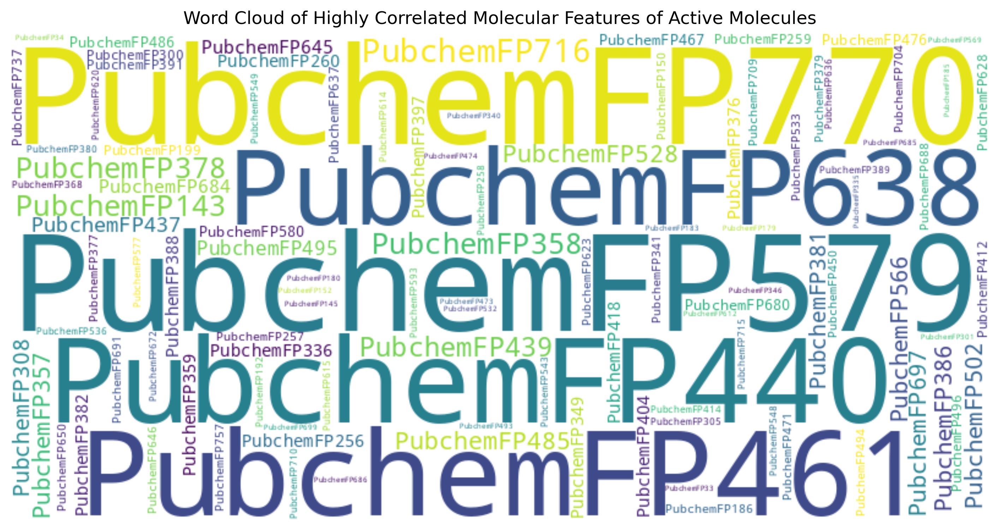

In [58]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

# Load the high-activity dataset
high_activity_file = "Active_Molecules.csv"
high_activity_df = pd.read_csv(high_activity_file)

# Drop unnecessary columns (pIC50, Dataset, Name)
feature_data = high_activity_df.drop(columns=["Activity", "Dataset", "Name"])

# Compute Correlation Matrix
correlation_matrix = feature_data.corr()

# Extract highly correlated features (|correlation| > 0.75)
high_correlation = (correlation_matrix.abs() > 0.75) & (correlation_matrix != 1.0)
important_features = high_correlation.sum(axis=1)
important_features = important_features[important_features > 0]  # Keep only relevant features

# Generate Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color="white").generate_from_frequencies(important_features)

# Plot the Word Cloud
plt.figure(figsize=(12, 6), dpi=300)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud of Highly Correlated Molecular Features of Active Molecules")

# Save the word cloud plot
wordcloud_plot_path = "WordCloud_Highly_Correlated_Features_Active_Molecules.png"
plt.savefig(wordcloud_plot_path, dpi=600)
plt.show()

# Display important features in a DataFrame
important_features_df = important_features.reset_index()
important_features_df.columns = ["Feature", "Correlation Count"]

In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import pdist, squareform

# Load the low-activity dataset
low_activity_file = "Inactive_Molecules.csv"
low_activity_df = pd.read_csv(low_activity_file)

# Extract molecule names
molecule_names = low_activity_df["Name"]

# Drop unnecessary columns (Activity, Dataset, Name)
fingerprint_data = low_activity_df.drop(columns=["Activity", "Dataset", "Name"])

# Compute Tanimoto similarity matrix using Jaccard distance
tanimoto_matrix = 1 - squareform(pdist(fingerprint_data, metric="jaccard"))

# Convert to DataFrame for visualization
tanimoto_df = pd.DataFrame(tanimoto_matrix, index=molecule_names, columns=molecule_names)

# Plot the heatmap
plt.figure(figsize=(15, 15), dpi=600)
sns.heatmap(tanimoto_df, cmap="coolwarm", xticklabels=True, yticklabels=True)
plt.title("Tanimoto Similarity Matrix of Inactive Molecules")
plt.xlabel("Molecule Name")
plt.ylabel("Molecule Name")

# Save the heatmap at 600 DPI
tanimoto_plot_path = "Tanimoto_Similarity_Inactive_Molecules.png"
plt.savefig(tanimoto_plot_path, dpi=600)
plt.show()

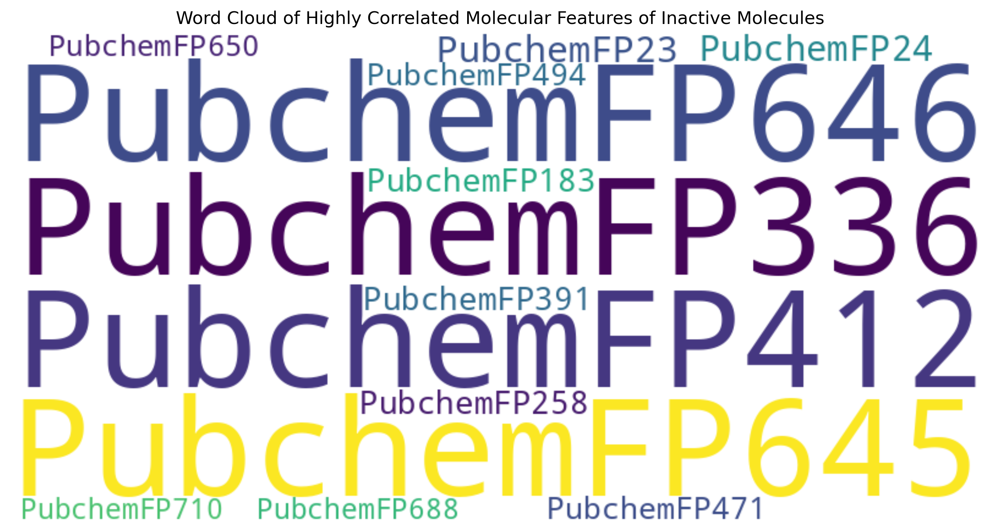

In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

# Load the high-activity dataset
high_activity_file = "Inactive_Molecules.csv"
high_activity_df = pd.read_csv(high_activity_file)

# Drop unnecessary columns (pIC50, Dataset, Name)
feature_data = high_activity_df.drop(columns=["Activity", "Dataset", "Name"])

# Compute Correlation Matrix
correlation_matrix = feature_data.corr()

# Extract highly correlated features (|correlation| > 0.75)
high_correlation = (correlation_matrix.abs() > 0.9) & (correlation_matrix != 1.0)
important_features = high_correlation.sum(axis=1)
important_features = important_features[important_features > 0]  # Keep only relevant features

# Generate Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color="white").generate_from_frequencies(important_features)

# Plot the Word Cloud
plt.figure(figsize=(12, 6), dpi=300)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud of Highly Correlated Molecular Features of Inactive Molecules")

# Save the word cloud plot
wordcloud_plot_path = "WordCloud_Highly_Correlated_Features_Inactive_Molecules.png"
plt.savefig(wordcloud_plot_path, dpi=600)
plt.show()

# Display important features in a DataFrame
important_features_df = important_features.reset_index()
important_features_df.columns = ["Feature", "Correlation Count"]

In [ ]:
import pandas as pd

# Load the new dataset
new_molecules_file = "subs_desc.csv"
new_molecules_df = pd.read_csv(new_molecules_file)

# Extract molecule names
molecule_names = new_molecules_df["Name"]

# Subset only the descriptors used in the trained ANN classifier
selected_features = X_train.columns  # Get the feature names from the trained model
filtered_new_molecules = new_molecules_df[selected_features]  # Keep only relevant descriptors

# Predict Activity using the trained ANN classifier
predicted_activity = best_ann.predict(filtered_new_molecules)

# Save predictions in a DataFrame
predictions_df = pd.DataFrame({
    "Name": molecule_names,
    "Activity": Activity
})

# Save predictions to CSV
predictions_file_path = "Predicted_Activity_New_Molecules.csv"
predictions_df.to_csv(predictions_file_path, index=False)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import pdist, squareform

# Load the dataset
file_path = "subs_desc.csv"
df = pd.read_csv(file_path)

# Extract molecule names
molecule_names = df["Name"]

# Drop the Name column to keep only descriptors
descriptor_data = df.drop(columns=["Name"])

# Compute Tanimoto similarity matrix using Jaccard distance
tanimoto_matrix = 1 - squareform(pdist(descriptor_data, metric="jaccard"))

# Convert to DataFrame for visualization
tanimoto_df = pd.DataFrame(tanimoto_matrix, index=molecule_names, columns=molecule_names)

# Plot the heatmap
plt.figure(figsize=(12, 10), dpi=300)
sns.heatmap(tanimoto_df, cmap="coolwarm", xticklabels=True, yticklabels=True)
plt.title("Tanimoto Similarity Matrix of Compounds")
plt.xlabel("Molecule Name")
plt.ylabel("Molecule Name")

# Save the heatmap at 600 DPI
tanimoto_plot_path = "Tanimoto_Similarity_Matrix.png"
plt.savefig(tanimoto_plot_path, dpi=600)
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

# Load the dataset
file_path = "subs_desc.csv"
df = pd.read_csv(file_path)

# Drop the Name column to keep only descriptors
descriptor_data = df.drop(columns=["Name"])

# Compute Pearson correlation matrix
correlation_matrix = descriptor_data.corr()

# Identify descriptors with correlation > 0.50 (highly correlated)
highly_correlated = (correlation_matrix.abs() > 0.40) & (correlation_matrix != 1.0)

# Count the number of high correlations for each descriptor
descriptor_correlation_scores = highly_correlated.sum(axis=1)

# Convert to dictionary for word cloud generation
descriptor_dict = descriptor_correlation_scores.to_dict()

# Generate Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color="white").generate_from_frequencies(descriptor_dict)

# Plot the Word Cloud
plt.figure(figsize=(12, 6), dpi=300)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud of Highly Correlated Descriptors")

# Save the word cloud plot at 600 DPI
wordcloud_plot_path = "WordCloud_Highly_Correlated_Pearson_new_molecules.png"
plt.savefig(wordcloud_plot_path, dpi=600)
plt.show()

In [ ]:
!zip -r PubChem_fp_model.zip /content